In [ ]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import classification_report
from tqdm import tqdm
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score
from scipy import interp
from itertools import cycle
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.cm import get_cmap
import seaborn as sns

In [ ]:
# Load data
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to fit models' input size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Normalization parameters for ImageNet
])

train_dataset = torchvision.datasets.ImageFolder(root='/My Drive/ip102/ip102_v1.1/images/train', transform=transform)
test_dataset = torchvision.datasets.ImageFolder(root='/My Drive/ip102/ip102_v1.1/images/test', transform=transform)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=128, shuffle=False)

# Set device
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [ ]:
val_dataset = torchvision.datasets.ImageFolder(root='/My Drive/ip102/ip102_v1.1/images/val', transform=transform)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=128, shuffle=False)

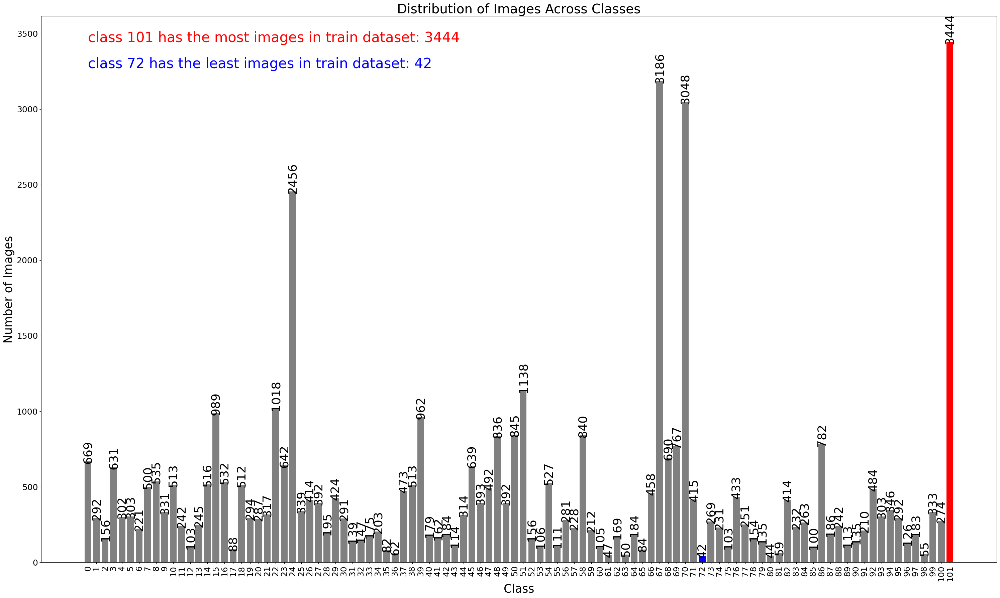

In [ ]:
import os
import matplotlib.pyplot as plt

train_dataset_root = "/My Drive/ip102/ip102_v1.1/images/train"  # Modify this with your path
class_folders = os.listdir(train_dataset_root)
class_counts = []

for class_folder in class_folders:
    class_path = os.path.join(train_dataset_root, class_folder)
    if os.path.isdir(class_path):
        num_images = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        class_counts.append(num_images)

# Sorting class folders and class counts by folder names
sorted_folders_and_counts = sorted(zip(class_folders, class_counts), key=lambda x: int(x[0]))
sorted_class_folders = [x[0] for x in sorted_folders_and_counts]
sorted_class_counts = [x[1] for x in sorted_folders_and_counts]

max_value = max(sorted_class_counts)
min_value = min(sorted_class_counts)
colors = ['red' if count == max_value else 'blue' if count == min_value else 'gray' for count in sorted_class_counts]

plt.figure(figsize=(30, 18))
bars = plt.bar(range(len(sorted_class_counts)), sorted_class_counts, color=colors)
plt.xlabel('Class', fontsize=25)
plt.ylabel('Number of Images', fontsize=25)
plt.title('Distribution of Images Across Classes', fontsize=28)
plt.xticks(np.arange(len(sorted_class_folders)), sorted_class_folders, rotation=90, fontsize=18) # Adjust the x-ticks
plt.yticks(fontsize=18)

# Find the classes with the most and least images
max_class = sorted_class_folders[sorted_class_counts.index(max_value)]
min_class = sorted_class_folders[sorted_class_counts.index(min_value)]

# Add text for the class with the most images
plt.text(0, max_value, f'class {max_class} has the most images in train dataset: {max_value}', fontsize=30, color='red')

# Add text for the class with the least images
plt.text(0, max_value - max_value*0.05, f'class {min_class} has the least images in train dataset: {min_value}', fontsize=30, color='blue')

# Adding the value above the bars
for bar, count in zip(bars, sorted_class_counts):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(count), ha='center', fontsize=26, color='black', rotation=90)

plt.tight_layout()  # Adjusts the plot so that everything fits
plt.show()

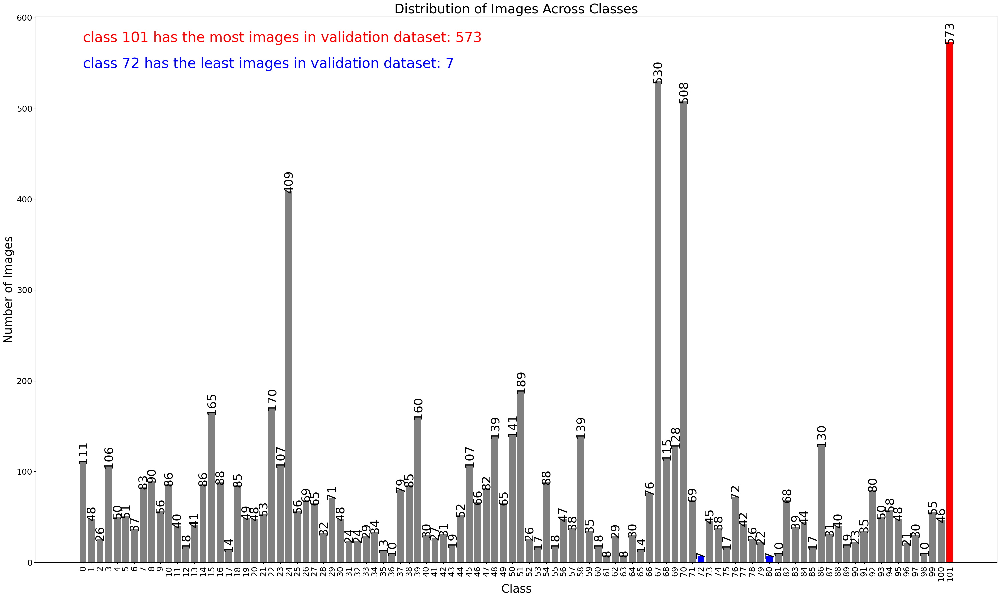

In [ ]:
val_dataset_root = "/My Drive/ip102/ip102_v1.1/images/val"  # Modify this with your path
class_folders = os.listdir(val_dataset_root)
class_counts = []

for class_folder in class_folders:
    class_path = os.path.join(val_dataset_root, class_folder)
    if os.path.isdir(class_path):
        num_images = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        class_counts.append(num_images)

# Sorting class folders and class counts by folder names
sorted_folders_and_counts = sorted(zip(class_folders, class_counts), key=lambda x: int(x[0]))
sorted_class_folders = [x[0] for x in sorted_folders_and_counts]
sorted_class_counts = [x[1] for x in sorted_folders_and_counts]

max_value = max(sorted_class_counts)
min_value = min(sorted_class_counts)
colors = ['red' if count == max_value else 'blue' if count == min_value else 'gray' for count in sorted_class_counts]

plt.figure(figsize=(30, 18))
bars = plt.bar(range(len(sorted_class_counts)), sorted_class_counts, color=colors)
plt.xlabel('Class', fontsize=25)
plt.ylabel('Number of Images', fontsize=25)
plt.title('Distribution of Images Across Classes', fontsize=28)
plt.xticks(np.arange(len(sorted_class_folders)), sorted_class_folders, rotation=90, fontsize=18) # Adjust the x-ticks
plt.yticks(fontsize=18)

# Find the classes with the most and least images
max_class = sorted_class_folders[sorted_class_counts.index(max_value)]
min_class = sorted_class_folders[sorted_class_counts.index(min_value)]

# Add text for the class with the most images
plt.text(0, max_value, f'class {max_class} has the most images in validation dataset: {max_value}', fontsize=30, color='red')

# Add text for the class with the least images
plt.text(0, max_value - max_value*0.05, f'class {min_class} has the least images in validation dataset: {min_value}', fontsize=30, color='blue')

# Adding the value above the bars
for bar, count in zip(bars, sorted_class_counts):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(count), ha='center', fontsize=26, color='black', rotation=90)

plt.tight_layout()  # Adjusts the plot so that everything fits
plt.show()

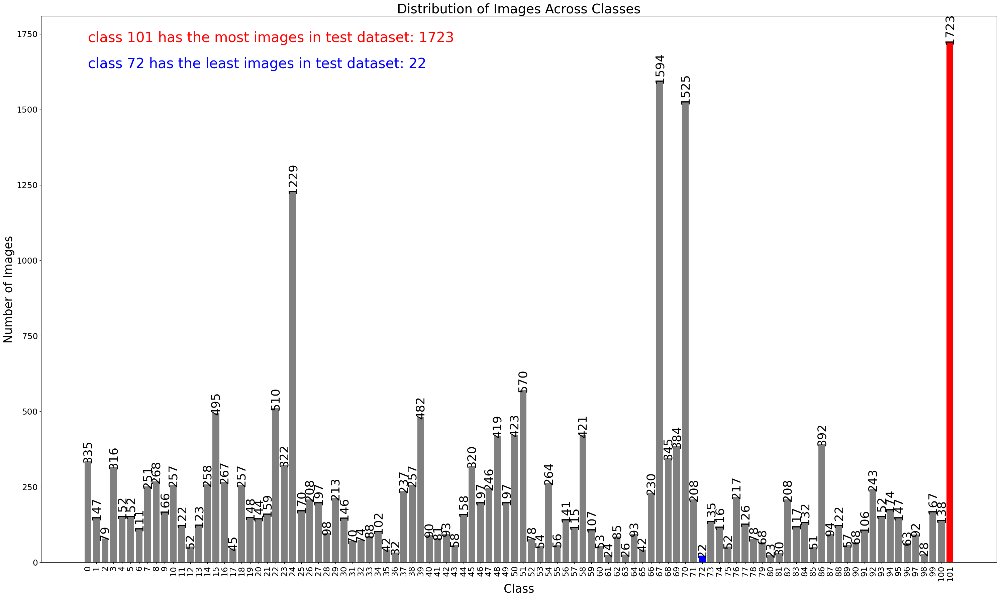

In [ ]:
test_dataset_root = "/My Drive/ip102/ip102_v1.1/images/test"  # Modify this with your path
class_folders = os.listdir(test_dataset_root)
class_counts = []

for class_folder in class_folders:
    class_path = os.path.join(test_dataset_root, class_folder)
    if os.path.isdir(class_path):
        num_images = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])
        class_counts.append(num_images)

# Sorting class folders and class counts by folder names
sorted_folders_and_counts = sorted(zip(class_folders, class_counts), key=lambda x: int(x[0]))
sorted_class_folders = [x[0] for x in sorted_folders_and_counts]
sorted_class_counts = [x[1] for x in sorted_folders_and_counts]

max_value = max(sorted_class_counts)
min_value = min(sorted_class_counts)
colors = ['red' if count == max_value else 'blue' if count == min_value else 'gray' for count in sorted_class_counts]

plt.figure(figsize=(30, 18))
bars = plt.bar(range(len(sorted_class_counts)), sorted_class_counts, color=colors)
plt.xlabel('Class', fontsize=25)
plt.ylabel('Number of Images', fontsize=25)
plt.title('Distribution of Images Across Classes', fontsize=28)
plt.xticks(np.arange(len(sorted_class_folders)), sorted_class_folders, rotation=90, fontsize=18) # Adjust the x-ticks
plt.yticks(fontsize=18)

# Find the classes with the most and least images
max_class = sorted_class_folders[sorted_class_counts.index(max_value)]
min_class = sorted_class_folders[sorted_class_counts.index(min_value)]

# Add text for the class with the most images
plt.text(0, max_value, f'class {max_class} has the most images in test dataset: {max_value}', fontsize=30, color='red')

# Add text for the class with the least images
plt.text(0, max_value - max_value*0.05, f'class {min_class} has the least images in test dataset: {min_value}', fontsize=30, color='blue')

# Adding the value above the bars
for bar, count in zip(bars, sorted_class_counts):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(count), ha='center', fontsize=26, color='black', rotation=90)

plt.tight_layout()  # Adjusts the plot so that everything fits
plt.show()

In [ ]:
from torchvision.models import alexnet
# Load pre-trained model and fine-tune
model_alex = alexnet(pretrained=True)
model_alex.classifier[6] = nn.Linear(4096, len(train_dataset.classes))  # Replace the last layer for the current task
model_alex = model_alex.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model_alex.parameters(), lr=0.01, weight_decay=0.0005, momentum=0.9)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)

In [ ]:
# Train the model
num_epochs = 30
save_interval = 3
patience = 5  # Number of epochs to wait for improvement before stopping
best_accuracy = 0.0  # Initialize best accuracy
epochs_without_improvement = 0

for epoch in range(num_epochs):
    loop_alex = tqdm(train_loader, total=len(train_loader), leave=True)
    for images, labels in loop_alex:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model_alex(images)
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update progress bar
        loop_alex.set_description(f"Epoch [{epoch}/{num_epochs}]")
        loop_alex.set_postfix(loss=loss.item())

# Evaluate on validation set
    model_alex.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        loop_alex_val = tqdm(val_loader, total=len(val_loader), leave=True)  # Progress bar for validation set
        for images, labels in loop_alex_val:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model_alex(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        accuracy = correct / total

        loop_alex_val.set_description(f"Validating")
        loop_alex_val.set_postfix(val_accuracy=accuracy)

    # Print the validation accuracy
    print(f'Validation Accuracy after epoch {epoch}: {accuracy * 100:.2f}%')

    # Check if accuracy has improved
    if accuracy > best_accuracy:
        best_accuracy = accuracy  # Update best accuracy
        epochs_without_improvement = 0  # Reset counter
        # Save model state
        torch.save({
            'epoch': epoch,
            'model_state_dict': model_alex.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            'accuracy': accuracy
        }, f"/My Drive/ip102/ip102_v1.1/best_alex_{epoch}.pth")
    else:
        epochs_without_improvement += 1

    # Check early stopping condition
    if epochs_without_improvement == patience:
        print("Early stopping due to no improvement.")
        break

    model_alex.train()  # Set model back to train mode

        # Save model state
    if epoch % save_interval == 0:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model_alex.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
        }, f"/My Drive/ip102/ip102_v1.1/checkpoint_alex_{epoch}.pth")

100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:24<00:00,  1.43s/it]


Validation Accuracy after epoch 0: 41.54%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:26<00:00,  1.46s/it]


Validation Accuracy after epoch 1: 46.68%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:30<00:00,  1.53s/it]


Validation Accuracy after epoch 2: 50.55%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:30<00:00,  1.54s/it]


Validation Accuracy after epoch 3: 52.92%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:23<00:00,  1.42s/it]


Validation Accuracy after epoch 4: 54.81%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:23<00:00,  1.41s/it]


Validation Accuracy after epoch 5: 54.62%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:23<00:00,  1.41s/it]


Validation Accuracy after epoch 6: 55.26%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.50s/it]


Validation Accuracy after epoch 7: 56.46%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.49s/it]


Validation Accuracy after epoch 8: 57.07%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:30<00:00,  1.54s/it]


Validation Accuracy after epoch 9: 56.94%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:29<00:00,  1.52s/it]


Validation Accuracy after epoch 10: 56.71%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.51s/it]


Validation Accuracy after epoch 11: 56.91%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:29<00:00,  1.51s/it]


Validation Accuracy after epoch 12: 58.24%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.51s/it]


Validation Accuracy after epoch 13: 58.44%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 14: 58.31%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.49s/it]


Validation Accuracy after epoch 15: 58.99%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.48s/it]


Validation Accuracy after epoch 16: 58.67%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 17: 59.83%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.48s/it]


Validation Accuracy after epoch 18: 59.22%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.50s/it]


Validation Accuracy after epoch 19: 59.67%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:29<00:00,  1.52s/it]


Validation Accuracy after epoch 20: 58.66%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.48s/it]


Validation Accuracy after epoch 21: 59.91%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:25<00:00,  1.45s/it]


Validation Accuracy after epoch 22: 59.74%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:26<00:00,  1.46s/it]


Validation Accuracy after epoch 23: 59.59%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.50s/it]


Validation Accuracy after epoch 24: 58.80%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.49s/it]


Validation Accuracy after epoch 25: 59.27%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.49s/it]


Validation Accuracy after epoch 26: 59.96%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.50s/it]


Validation Accuracy after epoch 27: 58.87%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:26<00:00,  1.47s/it]


Validation Accuracy after epoch 28: 59.83%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:26<00:00,  1.47s/it]

Validation Accuracy after epoch 29: 59.58%


In [ ]:
# Load the model state
checkpoint_alex = torch.load("/My Drive/ip102/ip102_v1.1/best_alex_26.pth")
model_alex.load_state_dict(checkpoint_alex['model_state_dict'])
optimizer.load_state_dict(checkpoint_alex['optimizer_state_dict'])
epoch = checkpoint_alex['epoch']
loss = checkpoint_alex['loss']

In [ ]:
# Test the model and generate classification report
model_alex.eval()
with torch.no_grad():
    y_true = []
    y_pred_alex = []
    loop_alex_test = tqdm(test_loader, total=len(test_loader), leave=True)  # Progress bar for test set
    for images, labels in loop_alex_test:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_alex(images)
        _, predicted = torch.max(outputs.data, 1)
        y_true += labels.tolist()
        y_pred_alex += predicted.tolist()

        # Update progress bar
        loop_alex_test.set_description("Testing")
        loop_alex_test.set_postfix()

print(classification_report(y_true, y_pred_alex, digits=2))

Testing: 100%|███████████████████████████████████████████████████████████████████████| 177/177 [04:34<00:00,  1.55s/it]

              precision    recall  f1-score   support

           0       0.62      0.72      0.66       335
           1       0.39      0.40      0.40       147
           2       0.63      0.66      0.65       257
           3       0.56      0.59      0.58       138
           4       0.79      0.72      0.76      1723
           5       0.52      0.40      0.45       122
           6       0.60      0.52      0.56        52
           7       0.45      0.30      0.36       123
           8       0.78      0.71      0.74       258
           9       0.71      0.89      0.79       495
          10       0.63      0.68      0.65       267
          11       0.44      0.44      0.44        45
          12       0.45      0.49      0.47       257
          13       0.22      0.22      0.22       148
          14       0.58      0.33      0.42        79
          15       0.33      0.32      0.32       144
          16       0.63      0.48      0.54       159
          17       0.58    

In [ ]:
# get classification report in dict format
report_dict_alex = classification_report(y_true, y_pred_alex, output_dict=True, zero_division=0)

# create DataFrame
df_alex = pd.DataFrame(report_dict_alex).transpose()

# sort by f1-score (high to low)
df_sorted_alex = df_alex.sort_values(by='f1-score', ascending=False)

# Get per-class report and aggregate report
per_class_report_alex = df_sorted_alex.loc[df_sorted_alex.index.str.isdigit()]
aggregate_report_alex = df_sorted_alex.loc[df_sorted_alex.index.str.isdigit() == False]

# Print them separately
print(per_class_report_alex.to_string(index=True))
print(aggregate_report_alex.to_string(index=True))

     precision    recall  f1-score  support
73    0.918699  0.837037  0.875969    135.0
61    0.909091  0.823529  0.864198     85.0
83    0.804545  0.850962  0.827103    208.0
54    0.808219  0.836879  0.822300    141.0
26    0.828571  0.794521  0.811189    146.0
66    0.814322  0.806148  0.810214   1594.0
9     0.712219  0.894949  0.793196    495.0
4     0.792994  0.722577  0.756149   1723.0
8     0.775424  0.709302  0.740891    258.0
96    0.720670  0.741379  0.730878    174.0
56    0.795518  0.674584  0.730077    421.0
21    0.679825  0.745192  0.711009    208.0
20    0.658291  0.770588  0.710027    170.0
60    0.708333  0.708333  0.708333     24.0
45    0.689977  0.706444  0.698113    419.0
97    0.677419  0.714286  0.695364    147.0
67    0.687500  0.669565  0.678414    345.0
68    0.634703  0.723958  0.676399    384.0
47    0.700000  0.644737  0.671233    152.0
76    0.620553  0.723502  0.668085    217.0
38    0.693333  0.641975  0.666667     81.0
94    0.662602  0.670782  0.6666

In [ ]:
# Define the number of your classes
n_classes = len(train_dataset.classes)

# These variables will store the true labels and predictions
y_test = []
y_score_alex = []

# Make predictions with your model
model_alex.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_alex(images)
        _, predicted = torch.max(outputs.data, 1)

        # Store the true labels and predictions in the lists
        y_test.extend(labels.tolist())
        y_score_alex.extend(outputs.tolist())

# Convert lists to numpy arrays
y_test = np.array(y_test)
y_score_alex = np.array(y_score_alex)

# Binarize the labels for ROC calculation
y_test_bin = label_binarize(y_test, classes=[i for i in range(n_classes)])

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score_alex[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score_alex.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])


C:\Users\Yuqi Gao\AppData\Local\Temp\ipykernel_36416\3867857608.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('plasma', 102)


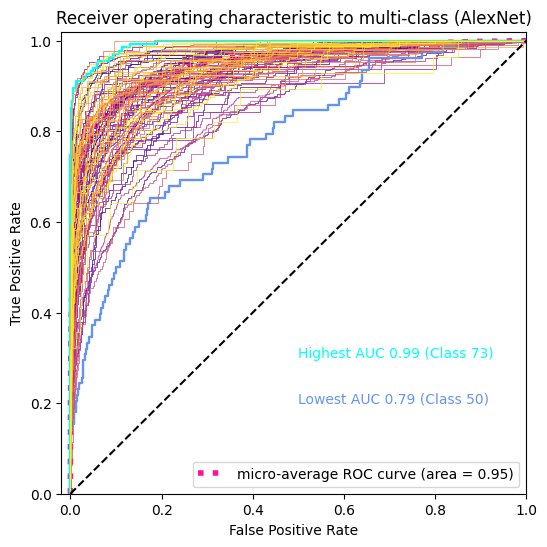

In [ ]:
plt.figure(figsize=(6, 6))

plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

# Find the indices of the max and min AUC
max_auc_index = max(roc_auc, key=roc_auc.get)
min_auc_index = min(roc_auc, key=roc_auc.get)

# Get a colormap with enough colors
cmap = get_cmap('plasma', 102)

for i in range(n_classes):
    color = cmap(i)
    if i == max_auc_index:
        plt.plot(fpr[i], tpr[i], color='aqua', lw=1.7)
        plt.text(0.5, 0.3, f'Highest AUC {roc_auc[i]:.2f} (Class {i})', color='aqua')
    elif i == min_auc_index:
        plt.plot(fpr[i], tpr[i], color='cornflowerblue', lw=1.7)
        plt.text(0.5, 0.2, f'Lowest AUC {roc_auc[i]:.2f} (Class {i})', color='cornflowerblue')
    else:
        plt.plot(fpr[i], tpr[i], color=color, lw=0.5)

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class (AlexNet)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from torchvision.models import googlenet
# Load pre-trained model and set requires_grad attribute
model_google = googlenet(pretrained=True)
for param in model_google.parameters():
    param.requires_grad = True

# Change the last layer
num_ftrs = model_google.fc.in_features
model_google.fc = nn.Linear(num_ftrs, len(train_dataset.classes))  # change 'num_classes' to your actual number of classes
model_google = model_google.to(device)

# Set dropout
model_google.dropout.p = 0.3

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model_google.parameters(), lr=0.01, momentum=0.9, weight_decay=0.0005)

# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)

C:\Users\Yuqi Gao\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Yuqi Gao\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# Train the model
num_epochs = 30
save_interval = 3
patience = 5  # Number of epochs to wait for improvement before stopping
best_accuracy = 0.0  # Initialize best accuracy
epochs_without_improvement = 0

for epoch in range(num_epochs):
    loop_google = tqdm(train_loader, total=len(train_loader), leave=True)
    for images, labels in loop_google:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model_google(images)
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update progress bar
        loop_google.set_description(f"Epoch [{epoch}/{num_epochs}]")
        loop_google.set_postfix(loss=loss.item())

# Evaluate on validation set
    model_google.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        loop_google_val = tqdm(val_loader, total=len(val_loader), leave=True)  # Progress bar for validation set
        for images, labels in loop_google_val:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model_google(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        accuracy = correct / total

        loop_google_val.set_description(f"Validating")
        loop_google_val.set_postfix(val_accuracy=accuracy)

    # Print the validation accuracy
    print(f'Validation Accuracy after epoch {epoch}: {accuracy * 100:.2f}%')

    # Check if accuracy has improved
    if accuracy > best_accuracy:
        best_accuracy = accuracy  # Update best accuracy
        epochs_without_improvement = 0  # Reset counter
        # Save model state
        torch.save({
            'epoch': epoch,
            'model_state_dict': model_google.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            'accuracy': accuracy
        }, f"/My Drive/ip102/ip102_v1.1/best_google_{epoch}.pth")
    else:
        epochs_without_improvement += 1

    # Check early stopping condition
    if epochs_without_improvement == patience:
        print("Early stopping due to no improvement.")
        break

    model_google.train()  # Set model back to train mode

        # Save model state
    if epoch % save_interval == 0:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model_google.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
        }, f"/My Drive/ip102/ip102_v1.1/checkpoint_google_{epoch}.pth")

100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:21<00:00,  1.38s/it]


Validation Accuracy after epoch 0: 49.19%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.37s/it]


Validation Accuracy after epoch 1: 57.55%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:19<00:00,  1.35s/it]


Validation Accuracy after epoch 2: 60.32%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.37s/it]


Validation Accuracy after epoch 3: 60.62%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.36s/it]


Validation Accuracy after epoch 4: 60.48%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.36s/it]


Validation Accuracy after epoch 5: 61.12%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.36s/it]


Validation Accuracy after epoch 6: 61.31%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:19<00:00,  1.35s/it]


Validation Accuracy after epoch 7: 61.09%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.37s/it]


Validation Accuracy after epoch 8: 60.66%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.36s/it]


Validation Accuracy after epoch 9: 62.72%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.36s/it]


Validation Accuracy after epoch 10: 61.41%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.36s/it]


Validation Accuracy after epoch 11: 60.59%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.36s/it]


Validation Accuracy after epoch 12: 62.23%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:18<00:00,  1.33s/it]


Validation Accuracy after epoch 13: 61.89%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:19<00:00,  1.35s/it]


Validation Accuracy after epoch 14: 63.00%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.37s/it]


Validation Accuracy after epoch 15: 62.27%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:21<00:00,  1.37s/it]


Validation Accuracy after epoch 16: 63.07%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:23<00:00,  1.41s/it]


Validation Accuracy after epoch 17: 62.27%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:19<00:00,  1.35s/it]


Validation Accuracy after epoch 18: 63.80%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.36s/it]


Validation Accuracy after epoch 19: 63.31%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.36s/it]


Validation Accuracy after epoch 20: 62.07%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:20<00:00,  1.37s/it]


Validation Accuracy after epoch 21: 63.68%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:21<00:00,  1.38s/it]


Validation Accuracy after epoch 22: 63.19%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:19<00:00,  1.35s/it]

Validation Accuracy after epoch 23: 61.85%
Early stopping due to no improvement.


In [ ]:
# Load the model state
checkpoint_google = torch.load("/My Drive/ip102/ip102_v1.1/best_google_18.pth")
model_google.load_state_dict(checkpoint_google['model_state_dict'])
optimizer.load_state_dict(checkpoint_google['optimizer_state_dict'])
epoch = checkpoint_google['epoch']
loss = checkpoint_google['loss']

In [ ]:
# Test the model and generate classification report
model_google.eval()
with torch.no_grad():
    y_true = []
    y_pred_google = []
    loop_google_test = tqdm(test_loader, total=len(test_loader), leave=True)  # Progress bar for test set
    for images, labels in loop_google_test:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_google(images)
        _, predicted = torch.max(outputs.data, 1)
        y_true += labels.tolist()
        y_pred_google += predicted.tolist()

        # Update progress bar
        loop_google_test.set_description("Testing")
        loop_google_test.set_postfix()

print(classification_report(y_true, y_pred_google, digits=2))

Testing: 100%|███████████████████████████████████████████████████████████████████████| 177/177 [04:39<00:00,  1.58s/it]

              precision    recall  f1-score   support

           0       0.63      0.73      0.68       335
           1       0.57      0.36      0.44       147
           2       0.81      0.57      0.67       257
           3       0.43      0.60      0.50       138
           4       0.84      0.79      0.81      1723
           5       0.54      0.36      0.43       122
           6       0.70      0.40      0.51        52
           7       0.42      0.26      0.32       123
           8       0.81      0.76      0.78       258
           9       0.89      0.89      0.89       495
          10       0.76      0.77      0.76       267
          11       0.38      0.40      0.39        45
          12       0.47      0.49      0.48       257
          13       0.27      0.34      0.30       148
          14       0.46      0.33      0.38        79
          15       0.49      0.21      0.29       144
          16       0.44      0.69      0.54       159
          17       0.55    

In [ ]:
# get classification report in dict format
report_dict_google = classification_report(y_true, y_pred_google, output_dict=True, zero_division=0)

# create DataFrame
df_google = pd.DataFrame(report_dict_google).transpose()

# sort by f1-score (high to low)
df_sorted_google = df_google.sort_values(by='f1-score', ascending=False)

# Get per-class report and aggregate report
per_class_report_google = df_sorted_google.loc[df_sorted_google.index.str.isdigit()]
aggregate_report_google = df_sorted_google.loc[df_sorted_google.index.str.isdigit() == False]

# Print them separately
print(per_class_report_google.to_string(index=True))
print(aggregate_report_google.to_string(index=True))

     precision    recall  f1-score  support
73    0.924242  0.903704  0.913858    135.0
9     0.894949  0.894949  0.894949    495.0
54    0.881119  0.893617  0.887324    141.0
61    0.801980  0.952941  0.870968     85.0
83    0.805310  0.875000  0.838710    208.0
66    0.810729  0.843789  0.826929   1594.0
20    0.852564  0.782353  0.815951    170.0
56    0.795918  0.833729  0.814385    421.0
4     0.835575  0.793384  0.813933   1723.0
26    0.750000  0.883562  0.811321    146.0
67    0.812883  0.768116  0.789866    345.0
45    0.784870  0.792363  0.788599    419.0
8     0.807377  0.763566  0.784861    258.0
78    0.794521  0.743590  0.768212     78.0
10    0.762082  0.767790  0.764925    267.0
68    0.753316  0.739583  0.746386    384.0
70    0.755034  0.737705  0.746269   1525.0
84    0.673913  0.794872  0.729412    117.0
96    0.735294  0.718391  0.726744    174.0
76    0.645914  0.764977  0.700422    217.0
33    0.803279  0.620253  0.700000    237.0
21    0.658120  0.740385  0.6968

In [ ]:
# Define the number of your classes
n_classes = len(train_dataset.classes)

# These variables will store the true labels and predictions
y_test = []
y_score_google = []

# Make predictions with your model
model_google.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_google(images)
        _, predicted = torch.max(outputs.data, 1)

        # Store the true labels and predictions in the lists
        y_test.extend(labels.tolist())
        y_score_google.extend(outputs.tolist())

# Convert lists to numpy arrays
y_test = np.array(y_test)
y_score_google = np.array(y_score_google)

# Binarize the labels for ROC calculation
y_test_bin = label_binarize(y_test, classes=[i for i in range(n_classes)])

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score_google[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score_google.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

C:\Users\Yuqi Gao\AppData\Local\Temp\ipykernel_36416\3235098920.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('plasma', 102)


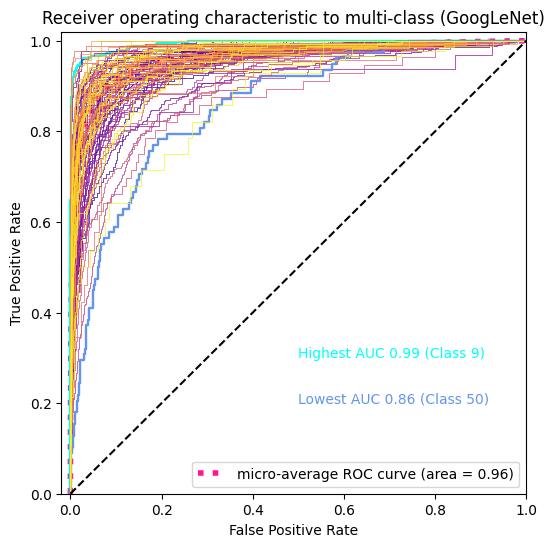

In [ ]:
plt.figure(figsize=(6, 6))

plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

# Find the indices of the max and min AUC
max_auc_index = max(roc_auc, key=roc_auc.get)
min_auc_index = min(roc_auc, key=roc_auc.get)

# Get a colormap with enough colors
cmap = get_cmap('plasma', 102)

for i in range(n_classes):
    color = cmap(i)
    if i == max_auc_index:
        plt.plot(fpr[i], tpr[i], color='aqua', lw=1.7)
        plt.text(0.5, 0.3, f'Highest AUC {roc_auc[i]:.2f} (Class {i})', color='aqua')
    elif i == min_auc_index:
        plt.plot(fpr[i], tpr[i], color='cornflowerblue', lw=1.7)
        plt.text(0.5, 0.2, f'Lowest AUC {roc_auc[i]:.2f} (Class {i})', color='cornflowerblue')
    else:
        plt.plot(fpr[i], tpr[i], color=color, lw=0.5)

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class (GoogLeNet)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from torchvision.models import resnet101
# Load pre-trained model and fine-tune
model_res = resnet101(pretrained=True)
model_res.fc = nn.Linear(model_res.fc.in_features, len(train_dataset.classes))  # Replace the last layer for the current task
model_res = model_res.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model_res.parameters(), lr=0.01, weight_decay=0.0005, momentum=0.9)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)

C:\Users\Yuqi Gao\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Yuqi Gao\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# Train the model
num_epochs = 30
save_interval = 3
patience = 5  # Number of epochs to wait for improvement before stopping
best_accuracy = 0.0  # Initialize best accuracy
epochs_without_improvement = 0

for epoch in range(num_epochs):
    loop_res = tqdm(train_loader, total=len(train_loader), leave=True)
    for images, labels in loop_res:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model_res(images)
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update progress bar
        loop_res.set_description(f"Epoch [{epoch}/{num_epochs}]")
        loop_res.set_postfix(loss=loss.item())

# Evaluate on validation set
    model_res.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        loop_res_val = tqdm(val_loader, total=len(val_loader), leave=True)  # Progress bar for validation set
        for images, labels in loop_res_val:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model_res(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        accuracy = correct / total

        loop_res_val.set_description(f"Validating")
        loop_res_val.set_postfix(val_accuracy=accuracy)

    # Print the validation accuracy
    print(f'Validation Accuracy after epoch {epoch}: {accuracy * 100:.2f}%')

    # Check if accuracy has improved
    if accuracy > best_accuracy:
        best_accuracy = accuracy  # Update best accuracy
        epochs_without_improvement = 0  # Reset counter
        # Save model state
        torch.save({
            'epoch': epoch,
            'model_state_dict': model_res.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            'accuracy': accuracy
        }, f"/My Drive/ip102/ip102_v1.1/best_resnet_{epoch}.pth")
    else:
        epochs_without_improvement += 1

    # Check early stopping condition
    if epochs_without_improvement == patience:
        print("Early stopping due to no improvement.")
        break

    model_res.train()  # Set model back to train mode

        # Save model state
    if epoch % save_interval == 0:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model_res.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
        }, f"/My Drive/ip102/ip102_v1.1/checkpoint_resnet_{epoch}.pth")

100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:26<00:00,  1.46s/it]


Validation Accuracy after epoch 0: 58.02%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:25<00:00,  1.44s/it]


Validation Accuracy after epoch 1: 58.91%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:25<00:00,  1.45s/it]


Validation Accuracy after epoch 2: 59.06%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:24<00:00,  1.44s/it]


Validation Accuracy after epoch 3: 62.43%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:25<00:00,  1.44s/it]


Validation Accuracy after epoch 4: 60.72%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:25<00:00,  1.45s/it]


Validation Accuracy after epoch 5: 62.83%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:25<00:00,  1.45s/it]


Validation Accuracy after epoch 6: 62.04%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:25<00:00,  1.44s/it]


Validation Accuracy after epoch 7: 60.34%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:25<00:00,  1.45s/it]


Validation Accuracy after epoch 8: 61.89%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:25<00:00,  1.45s/it]


Validation Accuracy after epoch 9: 61.92%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:26<00:00,  1.46s/it]

Validation Accuracy after epoch 10: 62.53%
Early stopping due to no improvement.


In [ ]:
# Load the model state
checkpoint_res = torch.load("/My Drive/ip102/ip102_v1.1/best_resnet_5.pth")
model_res.load_state_dict(checkpoint_res['model_state_dict'])
optimizer.load_state_dict(checkpoint_res['optimizer_state_dict'])
epoch = checkpoint_res['epoch']
loss = checkpoint_res['loss']

In [ ]:
# Test the model and generate classification report
model_res.eval()
with torch.no_grad():
    y_true = []
    y_pred_res = []
    loop_res_test = tqdm(test_loader, total=len(test_loader), leave=True)  # Progress bar for test set
    for images, labels in loop_res_test:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_res(images)
        _, predicted = torch.max(outputs.data, 1)
        y_true += labels.tolist()
        y_pred_res += predicted.tolist()

        # Update progress bar
        loop_res_test.set_description("Testing")
        loop_res_test.set_postfix()

print(classification_report(y_true, y_pred_res, digits=2))

Testing: 100%|███████████████████████████████████████████████████████████████████████| 177/177 [04:51<00:00,  1.65s/it]

              precision    recall  f1-score   support

           0       0.59      0.77      0.67       335
           1       0.56      0.29      0.38       147
           2       0.74      0.53      0.61       257
           3       0.64      0.54      0.58       138
           4       0.75      0.85      0.80      1723
           5       0.40      0.39      0.39       122
           6       0.66      0.37      0.47        52
           7       0.40      0.19      0.26       123
           8       0.88      0.68      0.77       258
           9       0.96      0.86      0.91       495
          10       0.88      0.63      0.73       267
          11       0.42      0.51      0.46        45
          12       0.51      0.40      0.45       257
          13       0.31      0.20      0.24       148
          14       0.36      0.25      0.30        79
          15       0.49      0.15      0.23       144
          16       0.78      0.11      0.20       159
          17       0.42    

In [ ]:
# get classification report in dict format
report_dict_res = classification_report(y_true, y_pred_res, output_dict=True, zero_division=0)

# create DataFrame
df_res = pd.DataFrame(report_dict_res).transpose()

# sort by f1-score (high to low)
df_sorted_res = df_res.sort_values(by='f1-score', ascending=False)

# Get per-class report and aggregate report
per_class_report_res = df_sorted_res.loc[df_sorted_res.index.str.isdigit()]
aggregate_report_res = df_sorted_res.loc[df_sorted_res.index.str.isdigit() == False]

# Print them separately
print(per_class_report_res.to_string(index=True))
print(aggregate_report_res.to_string(index=True))

     precision    recall  f1-score  support
61    0.974684  0.905882  0.939024     85.0
9     0.957303  0.860606  0.906383    495.0
54    0.975410  0.843972  0.904943    141.0
73    0.843537  0.918519  0.879433    135.0
83    0.871921  0.850962  0.861314    208.0
20    0.870370  0.829412  0.849398    170.0
56    0.902703  0.793349  0.844501    421.0
66    0.765634  0.852572  0.806768   1594.0
4     0.751534  0.853163  0.799130   1723.0
33    0.812207  0.729958  0.768889    237.0
8     0.879397  0.678295  0.765864    258.0
67    0.733154  0.788406  0.759777    345.0
70    0.705711  0.794098  0.747300   1525.0
68    0.716381  0.763021  0.738966    384.0
26    0.638191  0.869863  0.736232    146.0
10    0.879581  0.629213  0.733624    267.0
71    0.837500  0.644231  0.728261    208.0
45    0.932836  0.596659  0.727802    419.0
78    0.612613  0.871795  0.719577     78.0
65    0.770408  0.656522  0.708920    230.0
21    0.646586  0.774038  0.704595    208.0
96    0.615721  0.810345  0.6997

In [ ]:
# Define the number of your classes
n_classes = len(train_dataset.classes)

# These variables will store the true labels and predictions
y_test = []
y_score_res = []

# Make predictions with your model
model_res.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_res(images)
        _, predicted = torch.max(outputs.data, 1)

        # Store the true labels and predictions in the lists
        y_test.extend(labels.tolist())
        y_score_res.extend(outputs.tolist())

# Convert lists to numpy arrays
y_test = np.array(y_test)
y_score_res = np.array(y_score_res)

# Binarize the labels for ROC calculation
y_test_bin = label_binarize(y_test, classes=[i for i in range(n_classes)])

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score_res[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score_res.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

C:\Users\Yuqi Gao\AppData\Local\Temp\ipykernel_132892\3036543746.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('plasma', 102)


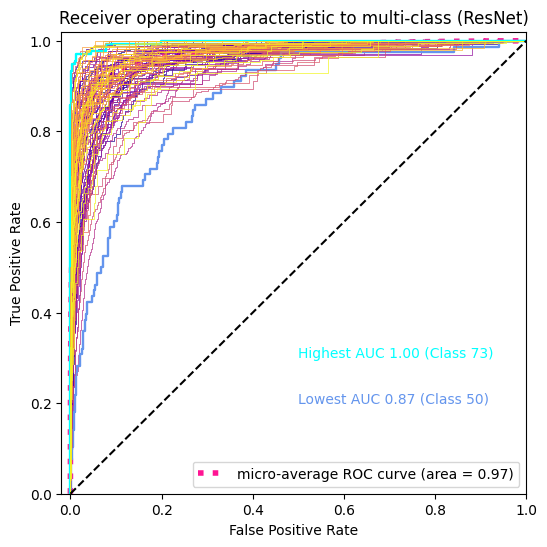

In [ ]:
plt.figure(figsize=(6, 6))

plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

# Find the indices of the max and min AUC
max_auc_index = max(roc_auc, key=roc_auc.get)
min_auc_index = min(roc_auc, key=roc_auc.get)

# Get a colormap with enough colors
cmap = get_cmap('plasma', 102)

for i in range(n_classes):
    color = cmap(i)
    if i == max_auc_index:
        plt.plot(fpr[i], tpr[i], color='aqua', lw=1.7)
        plt.text(0.5, 0.3, f'Highest AUC {roc_auc[i]:.2f} (Class {i})', color='aqua')
    elif i == min_auc_index:
        plt.plot(fpr[i], tpr[i], color='cornflowerblue', lw=1.7)
        plt.text(0.5, 0.2, f'Lowest AUC {roc_auc[i]:.2f} (Class {i})', color='cornflowerblue')
    else:
        plt.plot(fpr[i], tpr[i], color=color, lw=0.5)

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class (ResNet)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from torchvision.models import vgg16
# Load pre-trained model and set requires_grad attribute
model_vgg = vgg16(pretrained=True)
for param in model_vgg.parameters():
    param.requires_grad = True

# Change the last layer
num_ftrs = model_vgg.classifier[6].in_features
model_vgg.classifier[6] = nn.Linear(num_ftrs, len(train_dataset.classes))
model_vgg = model_vgg.to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model_vgg.parameters(), lr=0.01, weight_decay=0.0005, momentum=0.9)

# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)

C:\Users\Yuqi Gao\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Yuqi Gao\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# Train the model
num_epochs = 30
save_interval = 3
patience = 5  # Number of epochs to wait for improvement before stopping
best_accuracy = 0.0  # Initialize best accuracy
epochs_without_improvement = 0

for epoch in range(num_epochs):
    loop_vgg = tqdm(train_loader, total=len(train_loader), leave=True)
    for images, labels in loop_vgg:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model_vgg(images)
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update progress bar
        loop_vgg.set_description(f"Epoch [{epoch}/{num_epochs}]")
        loop_vgg.set_postfix(loss=loss.item())

# Evaluate on validation set
    model_vgg.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        loop_vgg_val = tqdm(val_loader, total=len(val_loader), leave=True)  # Progress bar for validation set
        for images, labels in loop_vgg_val:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model_vgg(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        accuracy = correct / total

        loop_vgg_val.set_description(f"Validating")
        loop_vgg_val.set_postfix(val_accuracy=accuracy)

    # Print the validation accuracy
    print(f'Validation Accuracy after epoch {epoch}: {accuracy * 100:.2f}%')

    # Check if accuracy has improved
    if accuracy > best_accuracy:
        best_accuracy = accuracy  # Update best accuracy
        epochs_without_improvement = 0  # Reset counter
        # Save model state
        torch.save({
            'epoch': epoch,
            'model_state_dict': model_vgg.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            'accuracy': accuracy
        }, f"/My Drive/ip102/ip102_v1.1/best_vgg_{epoch}.pth")
    else:
        epochs_without_improvement += 1

    # Check early stopping condition
    if epochs_without_improvement == patience:
        print("Early stopping due to no improvement.")
        break

    model_vgg.train()  # Set model back to train mode

        # Save model state
    if epoch % save_interval == 0:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model_vgg.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
        }, f"/My Drive/ip102/ip102_v1.1/checkpoint_vgg_{epoch}.pth")

100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:29<00:00,  1.52s/it]


Validation Accuracy after epoch 0: 50.04%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 1: 55.99%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 2: 56.95%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 3: 61.83%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.48s/it]


Validation Accuracy after epoch 4: 61.76%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 5: 62.52%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 6: 63.32%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.49s/it]


Validation Accuracy after epoch 7: 62.83%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 8: 63.16%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.48s/it]


Validation Accuracy after epoch 9: 63.69%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.50s/it]


Validation Accuracy after epoch 10: 63.24%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.48s/it]


Validation Accuracy after epoch 11: 62.99%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.50s/it]


Validation Accuracy after epoch 12: 64.77%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.48s/it]


Validation Accuracy after epoch 13: 64.48%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.48s/it]


Validation Accuracy after epoch 14: 63.72%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 15: 64.18%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 16: 65.60%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:28<00:00,  1.49s/it]


Validation Accuracy after epoch 17: 65.14%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 18: 63.93%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 19: 65.22%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.49s/it]


Validation Accuracy after epoch 20: 64.25%


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [01:27<00:00,  1.48s/it]

Validation Accuracy after epoch 21: 64.56%
Early stopping due to no improvement.


In [ ]:
# Load the model state
checkpoint_vgg = torch.load("/My Drive/ip102/ip102_v1.1/best_vgg_16.pth")
model_vgg.load_state_dict(checkpoint_vgg['model_state_dict'])
optimizer.load_state_dict(checkpoint_vgg['optimizer_state_dict'])
epoch = checkpoint_vgg['epoch']
loss = checkpoint_vgg['loss']

In [ ]:
# Test the model and generate classification report
model_vgg.eval()
with torch.no_grad():
    y_true = []
    y_pred_vgg = []
    loop_vgg_test = tqdm(test_loader, total=len(test_loader), leave=True)  # Progress bar for test set
    for images, labels in loop_vgg_test:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_vgg(images)
        _, predicted = torch.max(outputs.data, 1)
        y_true += labels.tolist()
        y_pred_vgg += predicted.tolist()

        # Update progress bar
        loop_vgg_test.set_description("Testing")
        loop_vgg_test.set_postfix()

print(classification_report(y_true, y_pred_vgg, digits=2))

Testing: 100%|███████████████████████████████████████████████████████████████████████| 177/177 [07:32<00:00,  2.56s/it]

              precision    recall  f1-score   support

           0       0.62      0.72      0.66       335
           1       0.49      0.35      0.41       147
           2       0.69      0.66      0.67       257
           3       0.56      0.64      0.60       138
           4       0.84      0.80      0.82      1723
           5       0.48      0.38      0.42       122
           6       0.62      0.50      0.55        52
           7       0.44      0.37      0.41       123
           8       0.79      0.84      0.81       258
           9       0.94      0.91      0.92       495
          10       0.78      0.76      0.77       267
          11       0.54      0.33      0.41        45
          12       0.47      0.58      0.52       257
          13       0.33      0.16      0.21       148
          14       0.30      0.43      0.36        79
          15       0.33      0.31      0.32       144
          16       0.56      0.58      0.57       159
          17       0.57    

In [ ]:
# get classification report in dict format
report_dict_vgg = classification_report(y_true, y_pred_vgg, output_dict=True, zero_division=0)

# create DataFrame
df_vgg = pd.DataFrame(report_dict_vgg).transpose()

# sort by f1-score (high to low)
df_sorted_vgg = df_vgg.sort_values(by='f1-score', ascending=False)

# Get per-class report and aggregate report
per_class_report_vgg = df_sorted_vgg.loc[df_sorted_vgg.index.str.isdigit()]
aggregate_report_vgg = df_sorted_vgg.loc[df_sorted_vgg.index.str.isdigit() == False]

# Print them separately
print(per_class_report_vgg.to_string(index=True))
print(aggregate_report_vgg.to_string(index=True))

     precision    recall  f1-score  support
9     0.939203  0.905051  0.921811    495.0
54    0.920863  0.907801  0.914286    141.0
73    0.871429  0.903704  0.887273    135.0
83    0.886700  0.865385  0.875912    208.0
61    0.846154  0.905882  0.875000     85.0
66    0.876404  0.831870  0.853556   1594.0
20    0.903448  0.770588  0.831746    170.0
26    0.792453  0.863014  0.826230    146.0
4     0.837887  0.800929  0.818991   1723.0
45    0.785235  0.837709  0.810624    419.0
8     0.785455  0.837209  0.810507    258.0
56    0.791762  0.821853  0.806527    421.0
67    0.832797  0.750725  0.789634    345.0
10    0.781609  0.764045  0.772727    267.0
78    0.697917  0.858974  0.770115     78.0
68    0.698661  0.815104  0.752404    384.0
70    0.765870  0.735738  0.750502   1525.0
76    0.691406  0.815668  0.748414    217.0
96    0.719780  0.752874  0.735955    174.0
97    0.676301  0.795918  0.731250    147.0
33    0.706349  0.751055  0.728016    237.0
38    0.714286  0.740741  0.7272

In [ ]:
# Define the number of your classes
n_classes = len(train_dataset.classes)

# These variables will store the true labels and predictions
y_test = []
y_score_vgg = []

# Make predictions with your model
model_vgg.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_vgg(images)
        _, predicted = torch.max(outputs.data, 1)

        # Store the true labels and predictions in the lists
        y_test.extend(labels.tolist())
        y_score_vgg.extend(outputs.tolist())

# Convert lists to numpy arrays
y_test = np.array(y_test)
y_score_vgg = np.array(y_score_vgg)

# Binarize the labels for ROC calculation
y_test_bin = label_binarize(y_test, classes=[i for i in range(n_classes)])

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score_vgg[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score_vgg.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

C:\Users\Yuqi Gao\AppData\Local\Temp\ipykernel_36416\3498069757.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('plasma', 102)


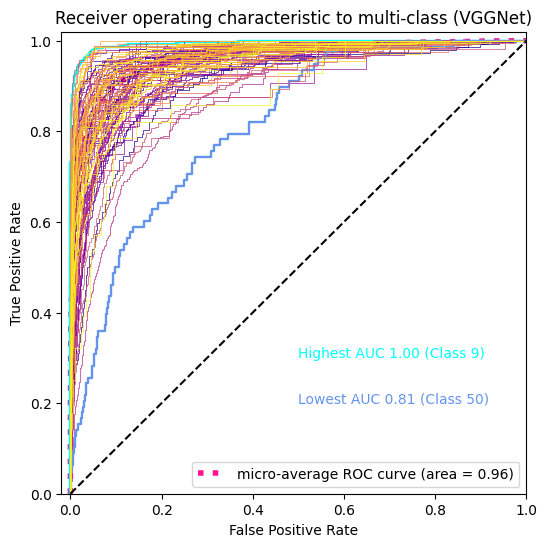

In [ ]:
plt.figure(figsize=(6, 6))

plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

# Find the indices of the max and min AUC
max_auc_index = max(roc_auc, key=roc_auc.get)
min_auc_index = min(roc_auc, key=roc_auc.get)

# Get a colormap with enough colors
cmap = get_cmap('plasma', 102)

for i in range(n_classes):
    color = cmap(i)
    if i == max_auc_index:
        plt.plot(fpr[i], tpr[i], color='aqua', lw=1.7)
        plt.text(0.5, 0.3, f'Highest AUC {roc_auc[i]:.2f} (Class {i})', color='aqua')
    elif i == min_auc_index:
        plt.plot(fpr[i], tpr[i], color='cornflowerblue', lw=1.7)
        plt.text(0.5, 0.2, f'Lowest AUC {roc_auc[i]:.2f} (Class {i})', color='cornflowerblue')
    else:
        plt.plot(fpr[i], tpr[i], color=color, lw=0.5)

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.02])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class (VGGNet)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from collections import defaultdict
import matplotlib.colors as mcolors

In [ ]:
# Define a function to get features from the model (modify as per your model architecture)
def get_features(model, dataloader):
    features_list = []
    labels_list = []

    # Register a hook to capture the output of the specific layer
    def hook(module, input, output):
        # Flatten the spatial dimensions
        output_flattened = output.view(output.size(0), -1)
        features_list.append(output_flattened.detach().cpu().numpy())

    # Register the hook on the last layer of the fully connected block
    handle = model_alex.classifier[6].register_forward_hook(hook)  # Adjust the index depending on the chosen layer

    model.eval()
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels_list.extend(labels.cpu().numpy())
            outputs = model(images)  # Running this will trigger the hook and append to features_list

    handle.remove()  # Remove the hook when done

    # Concatenate the features and labels into single arrays
    features = np.concatenate(features_list)
    labels = np.array(labels_list)

    return features, labels

In [ ]:
# Extract features and labels from validation set
features, labels = get_features(model_alex, val_loader)

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=0)
reduced_features = tsne.fit_transform(features)

In [ ]:
# Define the mapping of individual pests to crops
pest_classes = {
    "Rice": list(range(0, 14)),
    "Corn": list(range(14, 27)),
    "Wheat": list(range(27, 36)),
    "Beet": list(range(36, 43)),
    "Alfalfa": list(range(43, 57)),
    "Vitis": list(range(57, 74)),
    "Citrus": list(range(74, 93)),
    "Mango": list(range(93, 102))
}

# First, map each label to its corresponding superclass
superclass_map = {}
for superclass, pest_numbers in pest_classes.items():
    for number in pest_numbers:
        superclass_map[number] = superclass

# Convert the original labels to superclass labels
superclass_labels = [superclass_map.get(label) for label in labels]

# Get the unique superclasses for coloring and legend
unique_superclasses = list(pest_classes.keys())

# Convert superclass labels to corresponding color indices
colors = [unique_superclasses.index(superclass) for superclass in superclass_labels]

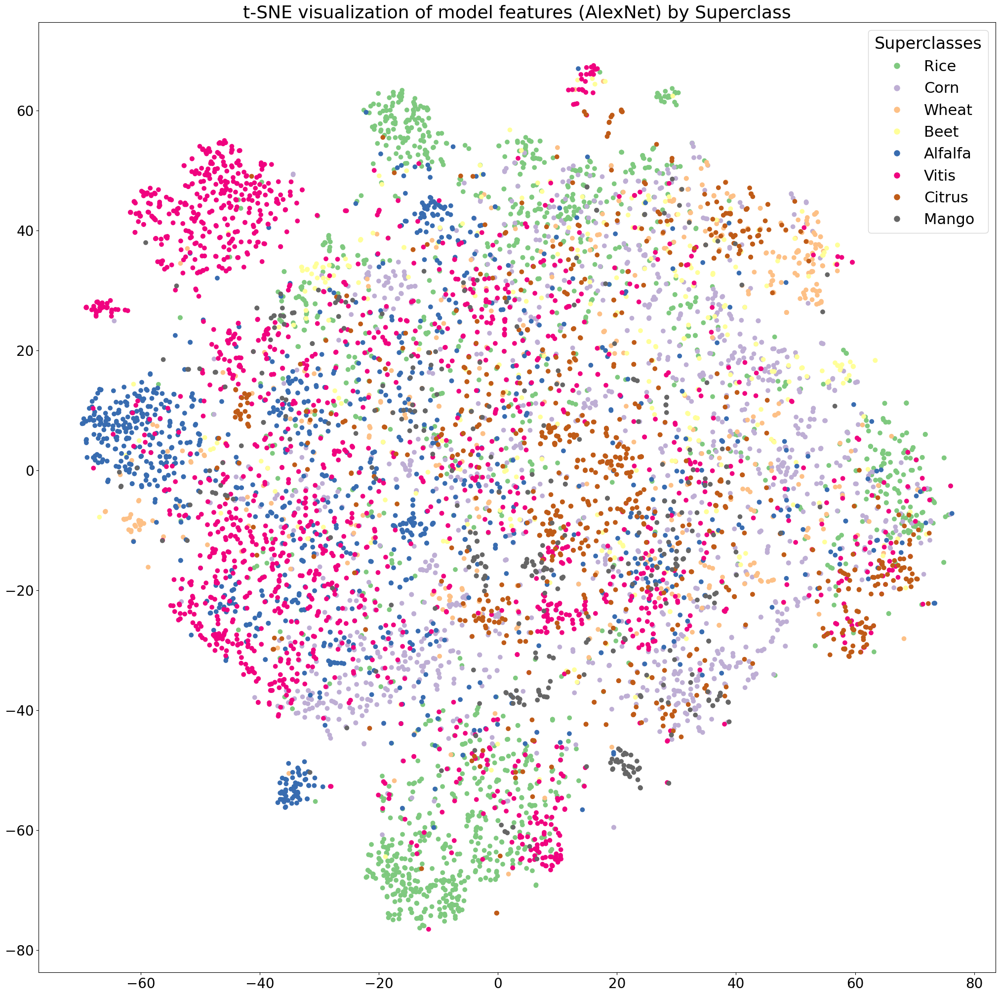

In [ ]:
plt.figure(figsize=(25, 25))
scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=colors, cmap='Accent') # Using Accent for a broader color range

# Manually set legend labels and colors
legend_labels = unique_superclasses
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.Accent(i/(len(unique_superclasses))), markersize=10) for i in range(len(unique_superclasses))]

plt.legend(legend_handles, legend_labels, title="Superclasses", fontsize=22, title_fontsize=24)
plt.title('t-SNE visualization of model features (AlexNet) by Superclass', fontsize=26)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [ ]:
def get_features(model, dataloader):
    # This function should register a hook to get the output of the layer of interest,
    # then run the validation data through the model, using the hook to extract the features.

    features_list = []
    labels_list = []

    # Register a hook to capture the output of the fully connected layer (or whichever layer you want to use)
    def hook(module, input, output):
        features_list.append(output.detach().cpu().numpy())

    handle = model_google.fc.register_forward_hook(hook)  # Change this if you want a different layer

    model.eval()
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels_list.extend(labels.cpu().numpy())
            outputs = model(images)  # Running this will trigger the hook and append to features_list

    handle.remove()  # Remove the hook when done

    # Concatenate the features and labels into single arrays
    features = np.concatenate(features_list)
    labels = np.array(labels_list)

    return features, labels

In [ ]:
# Extract features and labels from validation set
features, labels = get_features(model_google, val_loader)

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=0)
reduced_features = tsne.fit_transform(features)

In [ ]:
# Define the mapping of individual pests to crops
pest_classes = {
    "Rice": list(range(0, 14)),
    "Corn": list(range(14, 27)),
    "Wheat": list(range(27, 36)),
    "Beet": list(range(36, 43)),
    "Alfalfa": list(range(43, 57)),
    "Vitis": list(range(57, 74)),
    "Citrus": list(range(74, 93)),
    "Mango": list(range(93, 102))
}

# First, map each label to its corresponding superclass
superclass_map = {}
for superclass, pest_numbers in pest_classes.items():
    for number in pest_numbers:
        superclass_map[number] = superclass

# Convert the original labels to superclass labels
superclass_labels = [superclass_map.get(label) for label in labels]

# Get the unique superclasses for coloring and legend
unique_superclasses = list(pest_classes.keys())

# Convert superclass labels to corresponding color indices
colors = [unique_superclasses.index(superclass) for superclass in superclass_labels]

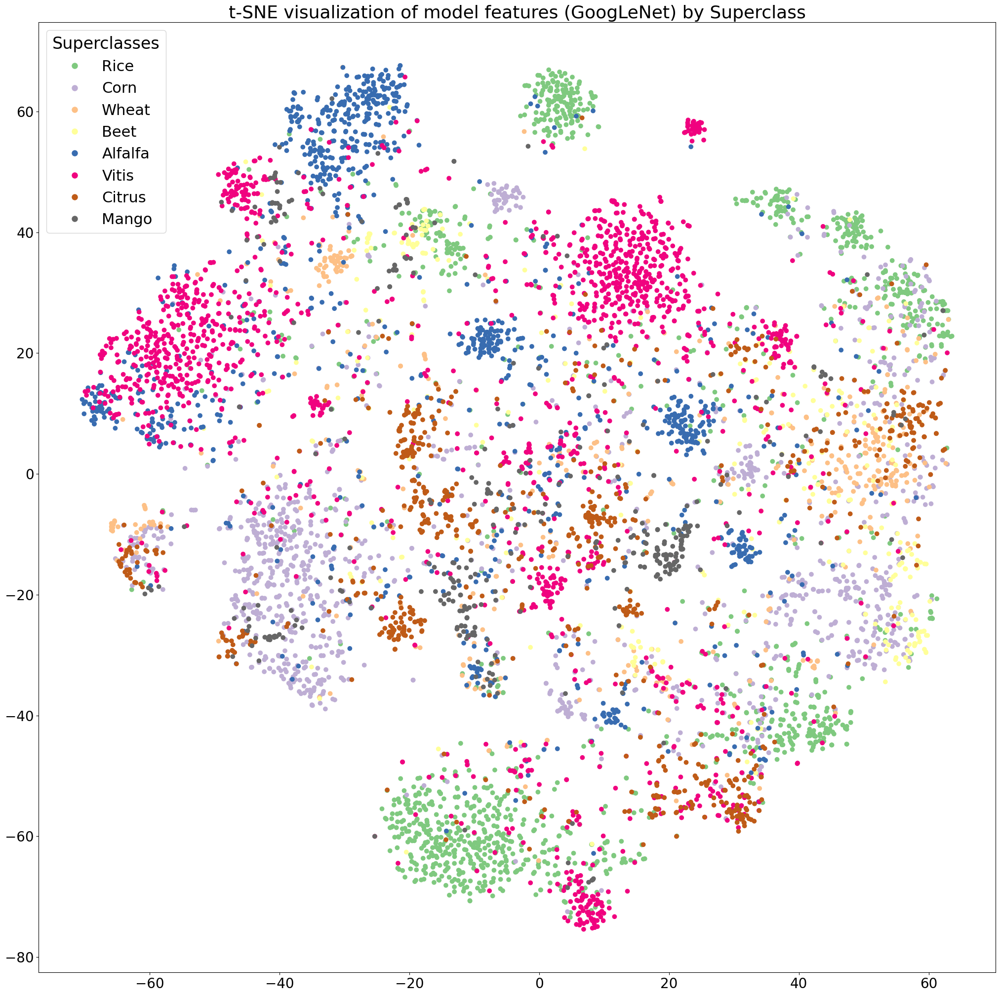

In [ ]:
plt.figure(figsize=(25, 25))
scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=colors, cmap='Accent') # Using Accent for a broader color range

# Manually set legend labels and colors
legend_labels = unique_superclasses
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.Accent(i/(len(unique_superclasses))), markersize=10) for i in range(len(unique_superclasses))]

plt.legend(legend_handles, legend_labels, title="Superclasses", fontsize=22, title_fontsize=24)
plt.title('t-SNE visualization of model features (GoogLeNet) by Superclass', fontsize=26)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [ ]:
def get_features(model, dataloader):
    # This function should register a hook to get the output of the layer of interest,
    # then run the validation data through the model, using the hook to extract the features.

    features_list = []
    labels_list = []

    # Register a hook to capture the output of the fully connected layer (or whichever layer you want to use)
    def hook(module, input, output):
        features_list.append(output.detach().cpu().numpy())

    handle = model_res.fc.register_forward_hook(hook)  # Change this if you want a different layer

    model.eval()
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels_list.extend(labels.cpu().numpy())
            outputs = model(images)  # Running this will trigger the hook and append to features_list

    handle.remove()  # Remove the hook when done

    # Concatenate the features and labels into single arrays
    features = np.concatenate(features_list)
    labels = np.array(labels_list)

    return features, labels

In [ ]:
# Extract features and labels from validation set
features, labels = get_features(model_res, val_loader)

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=0)
reduced_features = tsne.fit_transform(features)

In [ ]:
# Define the mapping of individual pests to crops
pest_classes = {
    "Rice": list(range(0, 14)),
    "Corn": list(range(14, 27)),
    "Wheat": list(range(27, 36)),
    "Beet": list(range(36, 43)),
    "Alfalfa": list(range(43, 57)),
    "Vitis": list(range(57, 74)),
    "Citrus": list(range(74, 93)),
    "Mango": list(range(93, 102))
}

# First, map each label to its corresponding superclass
superclass_map = {}
for superclass, pest_numbers in pest_classes.items():
    for number in pest_numbers:
        superclass_map[number] = superclass

# Convert the original labels to superclass labels
superclass_labels = [superclass_map.get(label) for label in labels]

# Get the unique superclasses for coloring and legend
unique_superclasses = list(pest_classes.keys())

# Convert superclass labels to corresponding color indices
colors = [unique_superclasses.index(superclass) for superclass in superclass_labels]

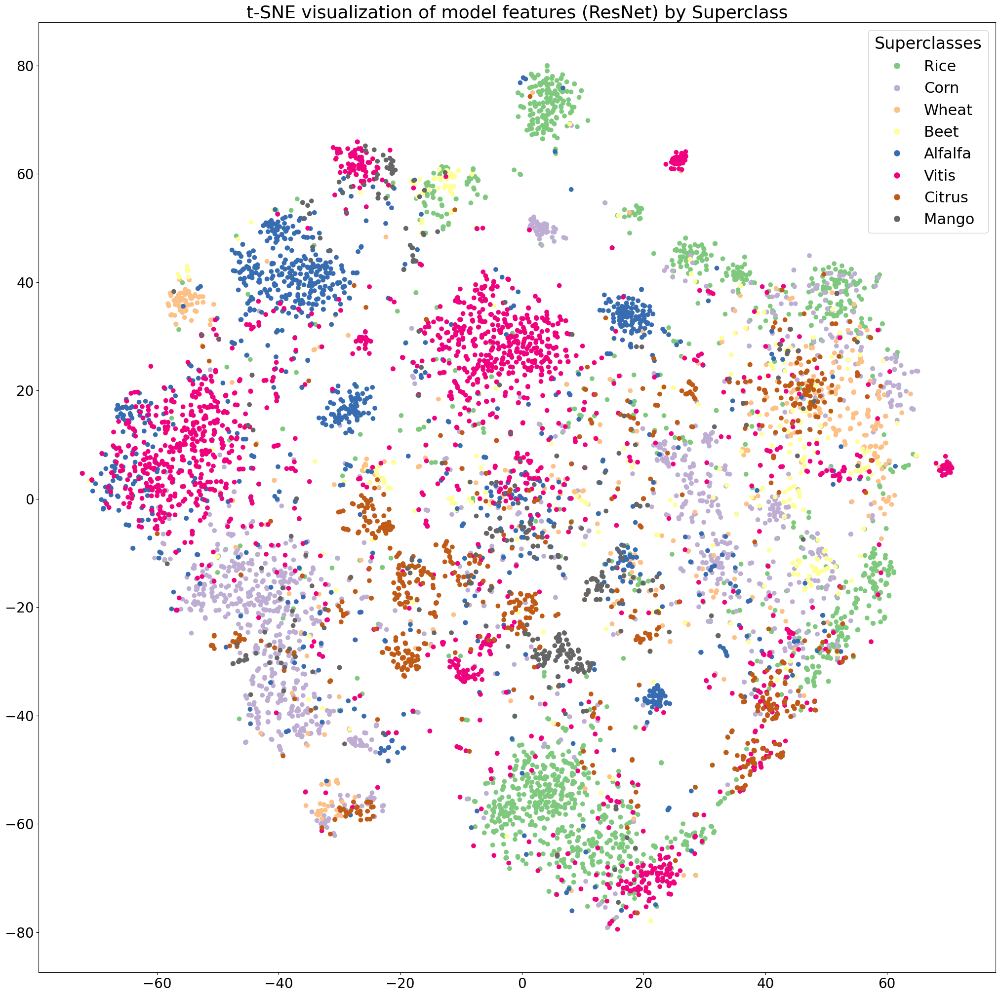

In [ ]:
plt.figure(figsize=(25, 25))
scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=colors, cmap='Accent') # Using Accent for a broader color range

# Manually set legend labels and colors
legend_labels = unique_superclasses
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.Accent(i/(len(unique_superclasses))), markersize=10) for i in range(len(unique_superclasses))]

plt.legend(legend_handles, legend_labels, title="Superclasses", fontsize=22, title_fontsize=24)
plt.title('t-SNE visualization of model features (ResNet) by Superclass', fontsize=26)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [ ]:
# Define a function to get features from the model (modify as per your model architecture)
def get_features(model, dataloader):
    features_list = []
    labels_list = []

    # Register a hook to capture the output of the specific layer
    def hook(module, input, output):
        # Flatten the spatial dimensions
        output_flattened = output.view(output.size(0), -1)
        features_list.append(output_flattened.detach().cpu().numpy())

    # Register the hook on the last activation layer of the 2D convolutional block
    handle = model_vgg.classifier[6].register_forward_hook(hook)  # Adjust the index depending on the chosen layer

    model.eval()
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels_list.extend(labels.cpu().numpy())
            outputs = model(images)  # Running this will trigger the hook and append to features_list

    handle.remove()  # Remove the hook when done

    # Concatenate the features and labels into single arrays
    features = np.concatenate(features_list)
    labels = np.array(labels_list)

    return features, labels

In [ ]:
# Extract features and labels from validation set
features, labels = get_features(model_vgg, val_loader)

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=0)
reduced_features = tsne.fit_transform(features)

In [ ]:
# Define the mapping of individual pests to crops
pest_classes = {
    "Rice": list(range(0, 14)),
    "Corn": list(range(14, 27)),
    "Wheat": list(range(27, 36)),
    "Beet": list(range(36, 43)),
    "Alfalfa": list(range(43, 57)),
    "Vitis": list(range(57, 74)),
    "Citrus": list(range(74, 93)),
    "Mango": list(range(93, 102))
}

# First, map each label to its corresponding superclass
superclass_map = {}
for superclass, pest_numbers in pest_classes.items():
    for number in pest_numbers:
        superclass_map[number] = superclass

# Convert the original labels to superclass labels
superclass_labels = [superclass_map.get(label) for label in labels]

# Get the unique superclasses for coloring and legend
unique_superclasses = list(pest_classes.keys())

# Convert superclass labels to corresponding color indices
colors = [unique_superclasses.index(superclass) for superclass in superclass_labels]

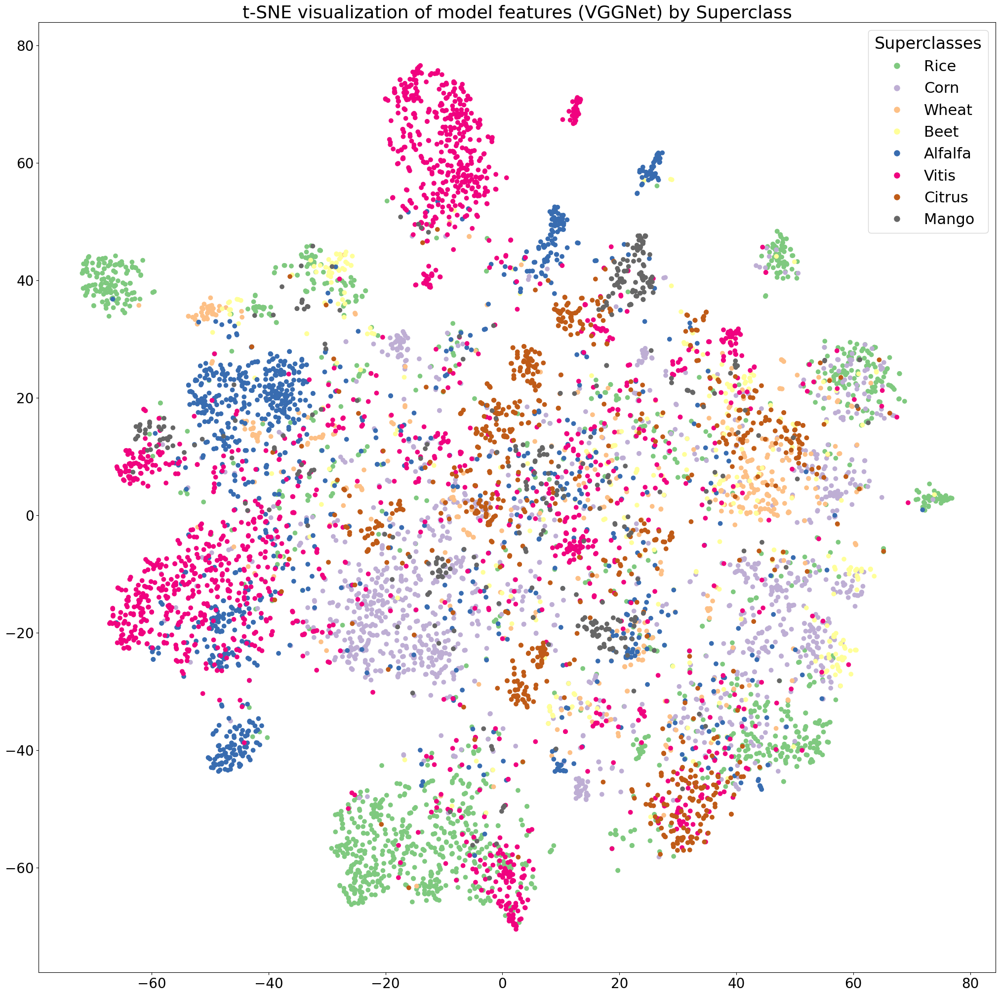

In [ ]:
plt.figure(figsize=(25, 25))
scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=colors, cmap='Accent') # Using Accent for a broader color range

# Manually set legend labels and colors
legend_labels = unique_superclasses
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.Accent(i/(len(unique_superclasses))), markersize=10) for i in range(len(unique_superclasses))]

plt.legend(legend_handles, legend_labels, title="Superclasses", fontsize=22, title_fontsize=24)
plt.title('t-SNE visualization of model features (VGGNet) by Superclass', fontsize=26)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [ ]:
f = open('/My Drive/ip102/classes.txt')
label = []
name = []
for line in f.readlines():
    label.append(int(line.split()[0]))
    name.append(' '.join(line.split()[1:]))
classes = pd.DataFrame([label, name]).T
classes.columns = ['label','name']

# Subtract 1 from each label in the DataFrame
classes['label'] = classes['label'].apply(lambda x: x - 1)

classes

,label,name
0,0,rice leaf roller
1,1,rice leaf caterpillar
2,2,paddy stem maggot
3,3,asiatic rice borer
4,4,yellow rice borer
...,...,...
97,97,Chlumetia transversa
98,98,Mango flat beak leafhopper
99,99,Rhytidodera bowrinii white
100,100,Sternochetus frigidus


In [ ]:
from textwrap import wrap
import random

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

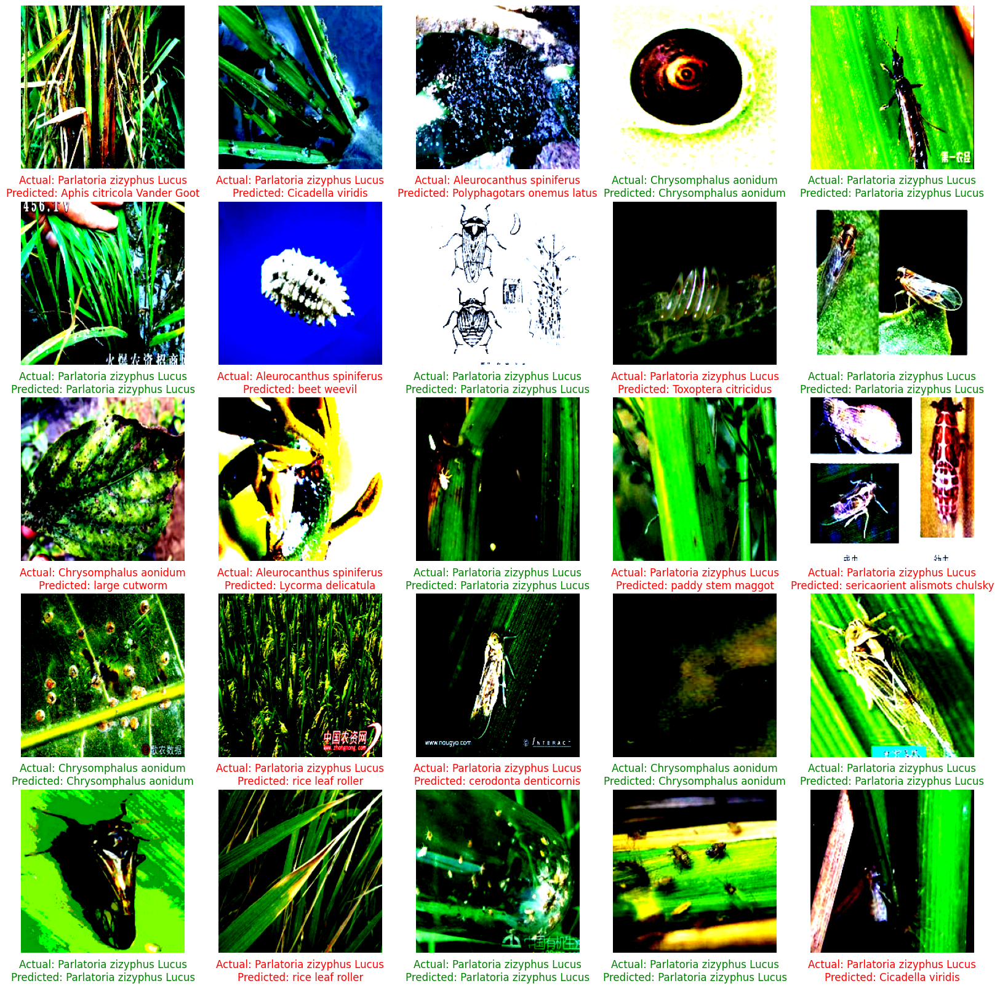

In [ ]:
model_alex.eval()
random.seed(77)
num_samples = 25
num_batches_to_sample = 5  # You can choose any number here, depending on how many batches you want to sample from
selected_images = []
selected_labels = []
selected_preds = []

# Get a random sample of batches
random_batches = random.sample(list(val_loader), num_batches_to_sample)

for images, labels in random_batches:
    images = images.to(device)
    labels = labels.to(device)
    outputs = model_alex(images)
    _, preds = torch.max(outputs, 1)

    # Randomly select indices from this batch
    random_indices = random.sample(range(len(images)), min(num_samples - len(selected_images), len(images)))

    for index in random_indices:
        selected_images.append(images[index])
        selected_labels.append(labels[index])
        selected_preds.append(preds[index])

    if len(selected_images) >= num_samples:
        break

# Plot the randomly selected images with their true and predicted labels
fig, axs = plt.subplots(5, 5, figsize=(20, 20))

for i in range(num_samples):
    ax = axs.ravel()[i]
    ax.imshow(selected_images[i].cpu().permute(1, 2, 0))  # Move image to CPU for matplotlib
    title = f'Actual: {class_names[selected_labels[i].item()]}\nPredicted: {class_names[selected_preds[i].item()]}'
    color = 'g' if selected_labels[i] == selected_preds[i] else 'r'
    ax.set_title(title, y=-0.20, color=color)
    ax.axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

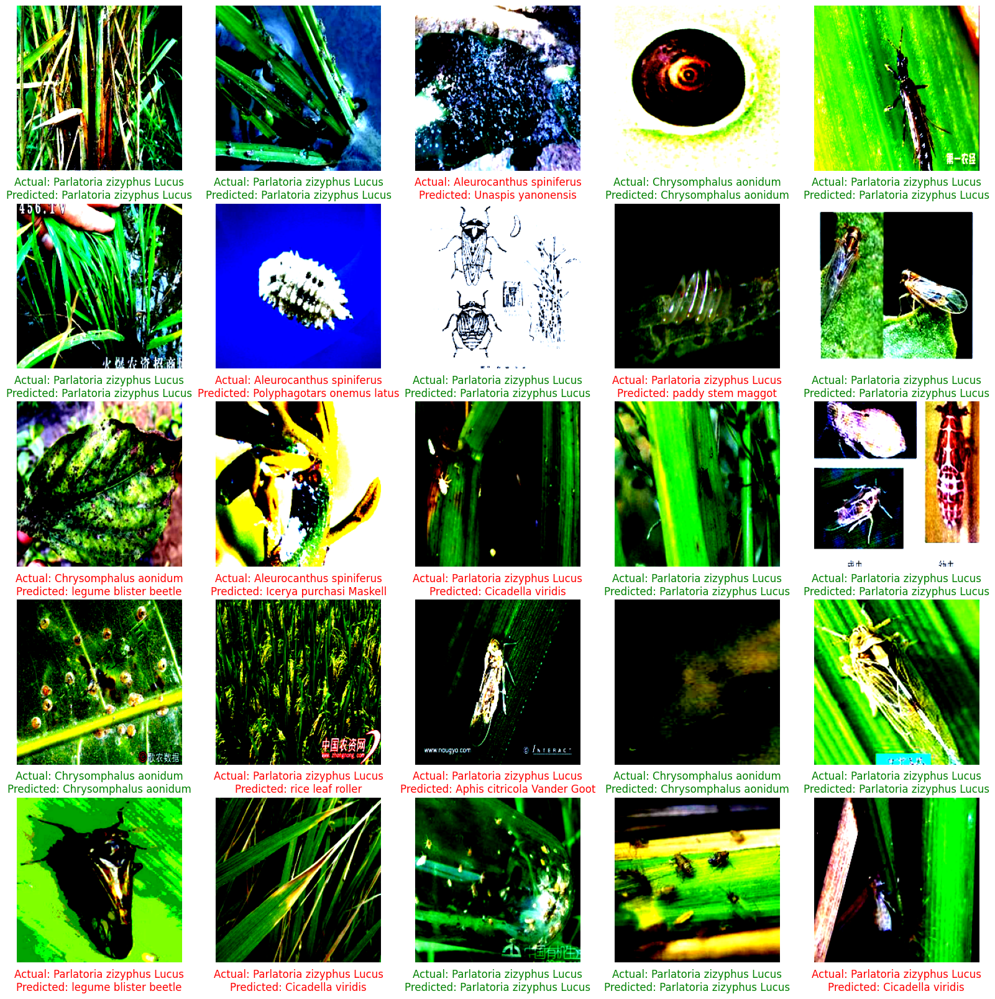

In [ ]:
model_google.eval()
random.seed(77)
num_samples = 25
num_batches_to_sample = 5  # You can choose any number here, depending on how many batches you want to sample from
selected_images = []
selected_labels = []
selected_preds = []

# Get a random sample of batches
random_batches = random.sample(list(val_loader), num_batches_to_sample)

for images, labels in random_batches:
    images = images.to(device)
    labels = labels.to(device)
    outputs = model_google(images)
    _, preds = torch.max(outputs, 1)

    # Randomly select indices from this batch
    random_indices = random.sample(range(len(images)), min(num_samples - len(selected_images), len(images)))

    for index in random_indices:
        selected_images.append(images[index])
        selected_labels.append(labels[index])
        selected_preds.append(preds[index])

    if len(selected_images) >= num_samples:
        break

# Plot the randomly selected images with their true and predicted labels
fig, axs = plt.subplots(5, 5, figsize=(20, 20))

for i in range(num_samples):
    ax = axs.ravel()[i]
    ax.imshow(selected_images[i].cpu().permute(1, 2, 0))  # Move image to CPU for matplotlib
    title = f'Actual: {class_names[selected_labels[i].item()]}\nPredicted: {class_names[selected_preds[i].item()]}'
    color = 'g' if selected_labels[i] == selected_preds[i] else 'r'
    ax.set_title(title, y=-0.20, color=color)
    ax.axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

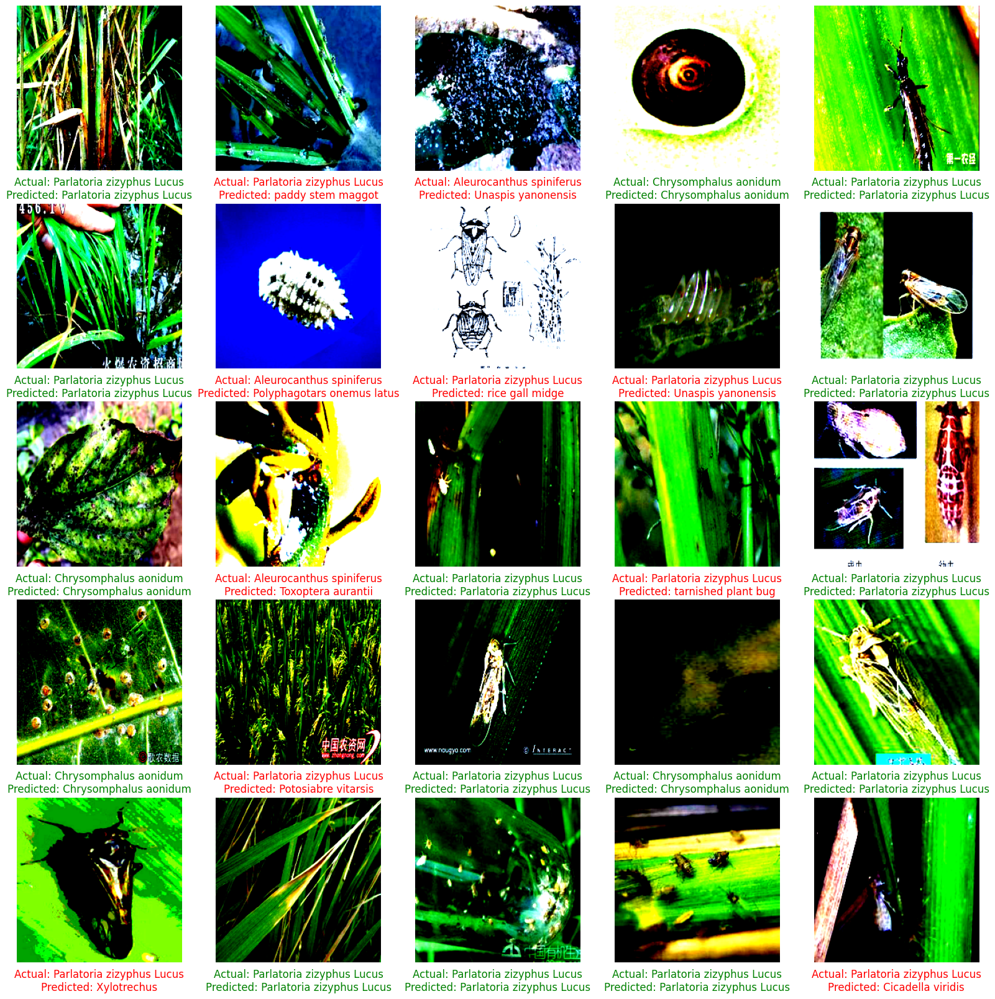

In [ ]:
model_res.eval()
random.seed(77)
num_samples = 25
num_batches_to_sample = 5  # You can choose any number here, depending on how many batches you want to sample from
selected_images = []
selected_labels = []
selected_preds = []

# Get a random sample of batches
random_batches = random.sample(list(val_loader), num_batches_to_sample)

for images, labels in random_batches:
    images = images.to(device)
    labels = labels.to(device)
    outputs = model_res(images)
    _, preds = torch.max(outputs, 1)

    # Randomly select indices from this batch
    random_indices = random.sample(range(len(images)), min(num_samples - len(selected_images), len(images)))

    for index in random_indices:
        selected_images.append(images[index])
        selected_labels.append(labels[index])
        selected_preds.append(preds[index])

    if len(selected_images) >= num_samples:
        break

# Plot the randomly selected images with their true and predicted labels
fig, axs = plt.subplots(5, 5, figsize=(20, 20))

for i in range(num_samples):
    ax = axs.ravel()[i]
    ax.imshow(selected_images[i].cpu().permute(1, 2, 0))  # Move image to CPU for matplotlib
    title = f'Actual: {class_names[selected_labels[i].item()]}\nPredicted: {class_names[selected_preds[i].item()]}'
    color = 'g' if selected_labels[i] == selected_preds[i] else 'r'
    ax.set_title(title, y=-0.20, color=color)
    ax.axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

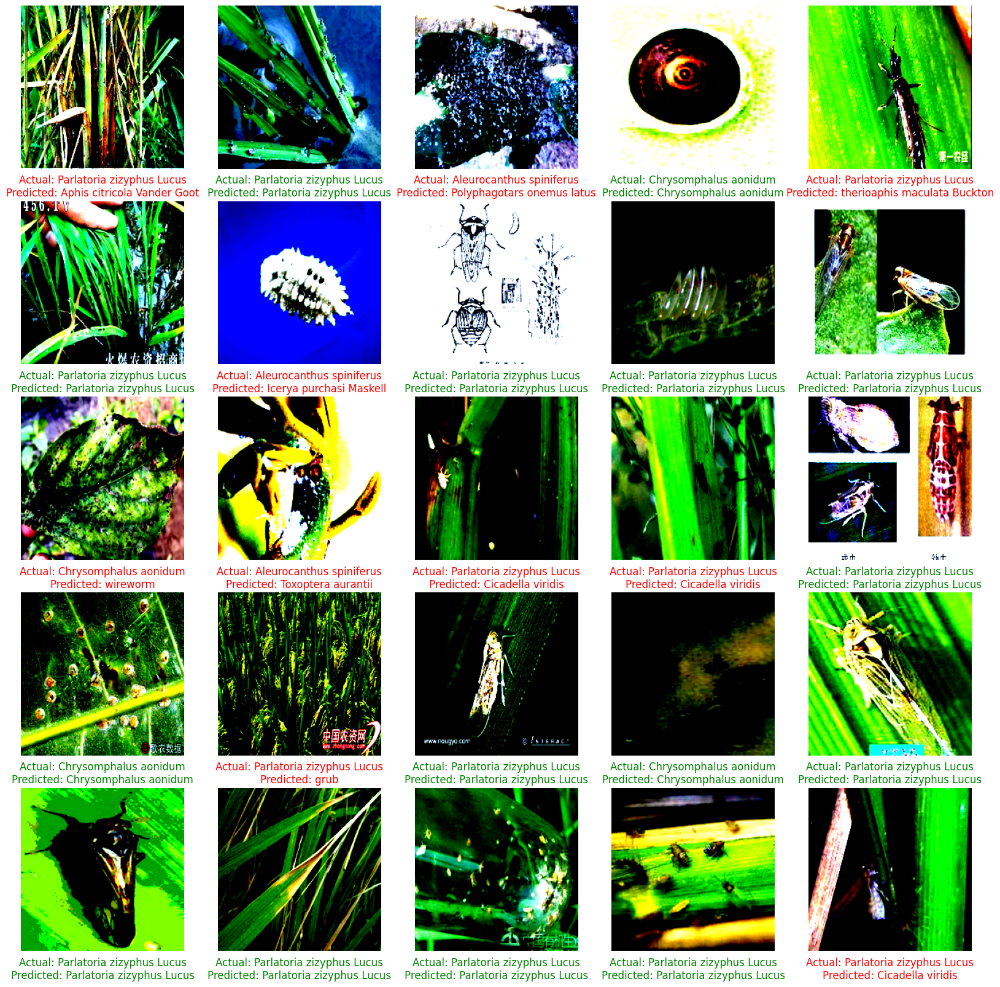

In [ ]:
model_vgg.eval()
random.seed(77)
num_samples = 25
num_batches_to_sample = 5  # You can choose any number here, depending on how many batches you want to sample from
selected_images = []
selected_labels = []
selected_preds = []

# Get a random sample of batches
random_batches = random.sample(list(val_loader), num_batches_to_sample)

for images, labels in random_batches:
    images = images.to(device)
    labels = labels.to(device)
    outputs = model_vgg(images)
    _, preds = torch.max(outputs, 1)

    # Randomly select indices from this batch
    random_indices = random.sample(range(len(images)), min(num_samples - len(selected_images), len(images)))

    for index in random_indices:
        selected_images.append(images[index])
        selected_labels.append(labels[index])
        selected_preds.append(preds[index])

    if len(selected_images) >= num_samples:
        break

# Plot the randomly selected images with their true and predicted labels
fig, axs = plt.subplots(5, 5, figsize=(20, 20))

for i in range(num_samples):
    ax = axs.ravel()[i]
    ax.imshow(selected_images[i].cpu().permute(1, 2, 0))  # Move image to CPU for matplotlib
    title = f'Actual: {class_names[selected_labels[i].item()]}\nPredicted: {class_names[selected_preds[i].item()]}'
    color = 'g' if selected_labels[i] == selected_preds[i] else 'r'
    ax.set_title(title, y=-0.20, color=color)
    ax.axis('off')

plt.show()

In [ ]:
import numpy as np
from scipy.stats import wilcoxon

# F1 scores for class 61, 73, 54 and 83
alexnet = np.array([0.864198, 0.875969, 0.822300, 0.827103])
googlenet = np.array([0.870968, 0.913858, 0.887324, 0.838710])
resnet = np.array([0.939024, 0.879433, 0.904943, 0.861314])
vggnet = np.array([0.875000, 0.887273, 0.914286, 0.875912])

# List of model pairs to compare
pairs = [
    ("AlexNet", "GoogLeNet", alexnet, googlenet),
    ("AlexNet", "ResNet", alexnet, resnet),
    ("AlexNet", "VGGNet", alexnet, vggnet),
    ("GoogLeNet", "ResNet", googlenet, resnet),
    ("GoogLeNet", "VGGNet", googlenet, vggnet),
    ("ResNet", "VGGNet", resnet, vggnet)
]

# Perform Wilcoxon Signed Ranks Test for each pair
for pair in pairs:
    model1, model2, scores1, scores2 = pair
    stat, p_value = wilcoxon(scores1, scores2)
    print(f"Comparison between {model1} and {model2}:")
    print(f"  W-statistic: {stat}, P-value: {p_value}")
    print("----------------------------------------")

Comparison between AlexNet and GoogLeNet:
  W-statistic: 0.0, P-value: 0.125
----------------------------------------
Comparison between AlexNet and ResNet:
  W-statistic: 0.0, P-value: 0.125
----------------------------------------
Comparison between AlexNet and VGGNet:
  W-statistic: 0.0, P-value: 0.125
----------------------------------------
Comparison between GoogLeNet and ResNet:
  W-statistic: 3.0, P-value: 0.625
----------------------------------------
Comparison between GoogLeNet and VGGNet:
  W-statistic: 2.0, P-value: 0.375
----------------------------------------
Comparison between ResNet and VGGNet:
  W-statistic: 4.0, P-value: 0.875
----------------------------------------
